# Diabetes Diagnosis Classificator

 ### University of Porto - School of Engineering

 #### Master’s degree in Data Science & Engineering (MECD) - FEUP
 
 #### Authors: Ian Karkles and Sónia Ferreira

## Approach using CRISP-DM Methodology
### Business Context - Diabetes Classificator
> Diabetes is a worldwide disease, with more than 500 million people living with it today, nearly one in ten living with it.

>Even with a high number of people living with this disease, 3 out of 4 are from low and medium-income countries that do not have the resources to map and treat rightfully this disease, which may affect the daily life of a person who is not aware of this illness.

>One of the main reasons for the lack of the right diagnosis is the lack of technical skills to interpret the results of exams in these low-income countries.

>In this way, the main idea of this classifier is to guide low and medium-income health professionals to classify a Diabetes case with simple exams in a person who most probably would be unaware of the disease until would be too late.

Source: International Diabetes Federation. (2021). IDF Diabetes Atlas 10th edition 2021. Diabetesatlas.org. https://diabetesatlas.org/

### Data Context - What is the available data and how it's distributed
>In the context of Data Classification, there are multiple classification methods that can help to solve this type of problem. For this type of problem, we gathered this famous dataset from Kaggle: https://www.kaggle.com/uciml/pima-indians-diabetes-database, which have a 8.9 Score on the Kaggle Usability Score

> This dataset contains multiple features that can help the classifier model to rightfully classify the case of diabetes or not.

The Dataset have the following columns to explore:


Columns  | Meaning
-------------------|------------------
Pregnancies               | Number of times pregnant
Glucose                   | Plasma Glucose concentration a 2 hours in a oral glucose tolerance test
BloodPressure             | Diastolic blood pressure (mm/Hg) 
SkinThickness             | The Triceps skin fold thickness (mm)
Insulin                   | 2-Hour serum insulin (MuU/ml)
BMI                       | Body Mass Index (weight in Kg/(height in m)^2)
DiabetesPedigreeFunction  | Diabetes pedigree function
Age                       | Age of the Patient in Years
Outcome                   | Class variable (0 or 1) 268 of 768 are 1 and the others are 0



# Diabetes Diagnosis Classificator - Source Code

## **Library Imports and Data Extration**

In [1]:
import pandas                  as pd
import numpy                   as np
from pandas_profiling          import ProfileReport
from pandas.plotting           import scatter_matrix
import matplotlib.pyplot       as plt
import seaborn                 as sns
import missingno               as msno
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.ensemble          import IsolationForest
from pandas                    import set_option
from pandas.plotting           import scatter_matrix
from sklearn.preprocessing     import StandardScaler
from sklearn.model_selection   import train_test_split
from sklearn.model_selection   import KFold
from sklearn.model_selection   import StratifiedKFold
from sklearn.model_selection   import cross_val_score
from sklearn.model_selection   import cross_val_predict
from sklearn.model_selection   import GridSearchCV
from sklearn.metrics           import classification_report
from sklearn.metrics           import confusion_matrix
from sklearn.metrics           import accuracy_score
from sklearn.metrics           import roc_curve, auc
from sklearn.pipeline          import Pipeline
from sklearn.linear_model      import LogisticRegression
from sklearn.tree              import DecisionTreeClassifier
from sklearn.neighbors         import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes       import GaussianNB
from sklearn.svm               import SVC
from sklearn.ensemble          import AdaBoostClassifier
from sklearn.ensemble          import GradientBoostingClassifier
from sklearn.ensemble          import RandomForestClassifier
from sklearn.ensemble          import ExtraTreesClassifier
from xgboost                   import XGBClassifier
from sklearn.preprocessing     import MinMaxScaler
import plotly.offline          as py
import plotly.graph_objs       as go
import plotly.tools            as tls
from scipy.stats import ttest_ind
py.init_notebook_mode(connected=True)
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Defined Seed for Reproducibility
SEED = 7
np.random.seed(SEED)

In [2]:
# Dataset to be used: https://www.kaggle.com/uciml/pima-indians-diabetes-database

df = pd.read_csv('diabetes.csv')
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


## **Exploratory Data Analysis (EDA)**
This section seeks to answer the questions listed in the business context section. The data will be analized and vizualized for easy understanding and followed with appropriated statistical analysis for empirical findings within the data. <br>
The following questions will be answered within this section:<br>
- From the total of patients in this study who many are diabetic and non-diabetic?<br>
- Is there a diference in the average age of patientes with diabetes and without?<br>
- Do diabetic and non-diabetic patients have similar levels of glucose, insulin, blood pressure and BMI?<br>
- Is the skin thickness and the diabetes pedrigree function similiar between patientes with and without diabetes?<br>

In [3]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dataset information

In [4]:
shape = df.shape #total nr of rows and colums
print(f"Dataframe shape: {shape}")

Dataframe shape: (768, 9)


In [5]:
df.info(verbose=True) #colums and corresponding data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


Dataset comprises of 768 observations and 9 characteristicts. <br>
Out of which one is a dependent variable and the remain are independent:
*   Dependendent variable: Outcome;
*   Independent variable: All of the rest of the Features.

### Missing Values

In [6]:
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

<AxesSubplot:>

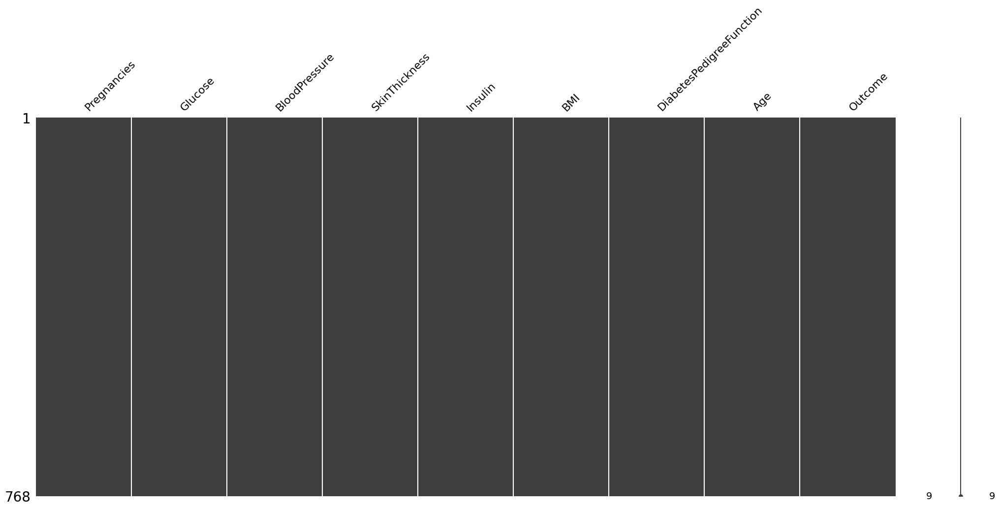

In [7]:
%matplotlib inline  
# to display the plot next to the code
msno.matrix(df)

### Redundant Data

In [8]:
df.duplicated().value_counts() # check for duplicate values

False    768
dtype: int64

### Plotting individual data (to have a better undersand of the dataset)

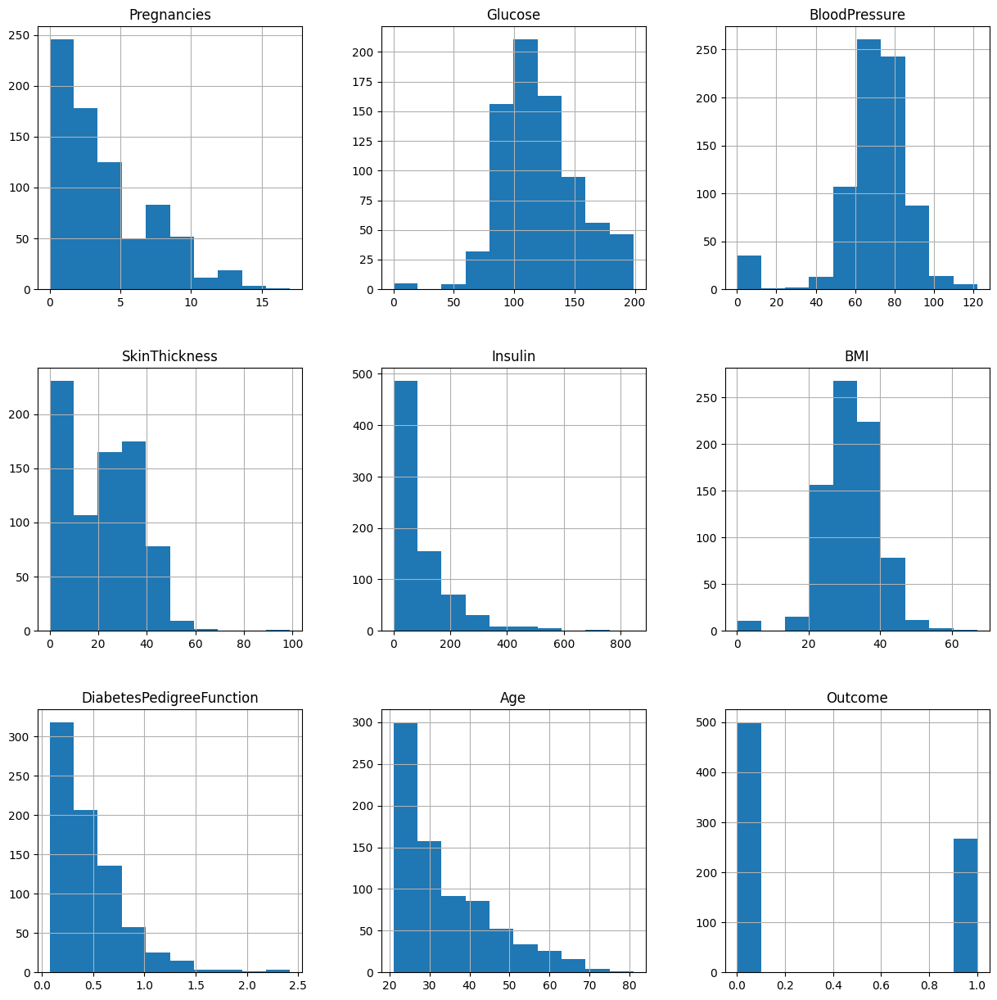

In [9]:
# Plotting Data to understand the distribution
plot = df.hist(figsize = (15,15))

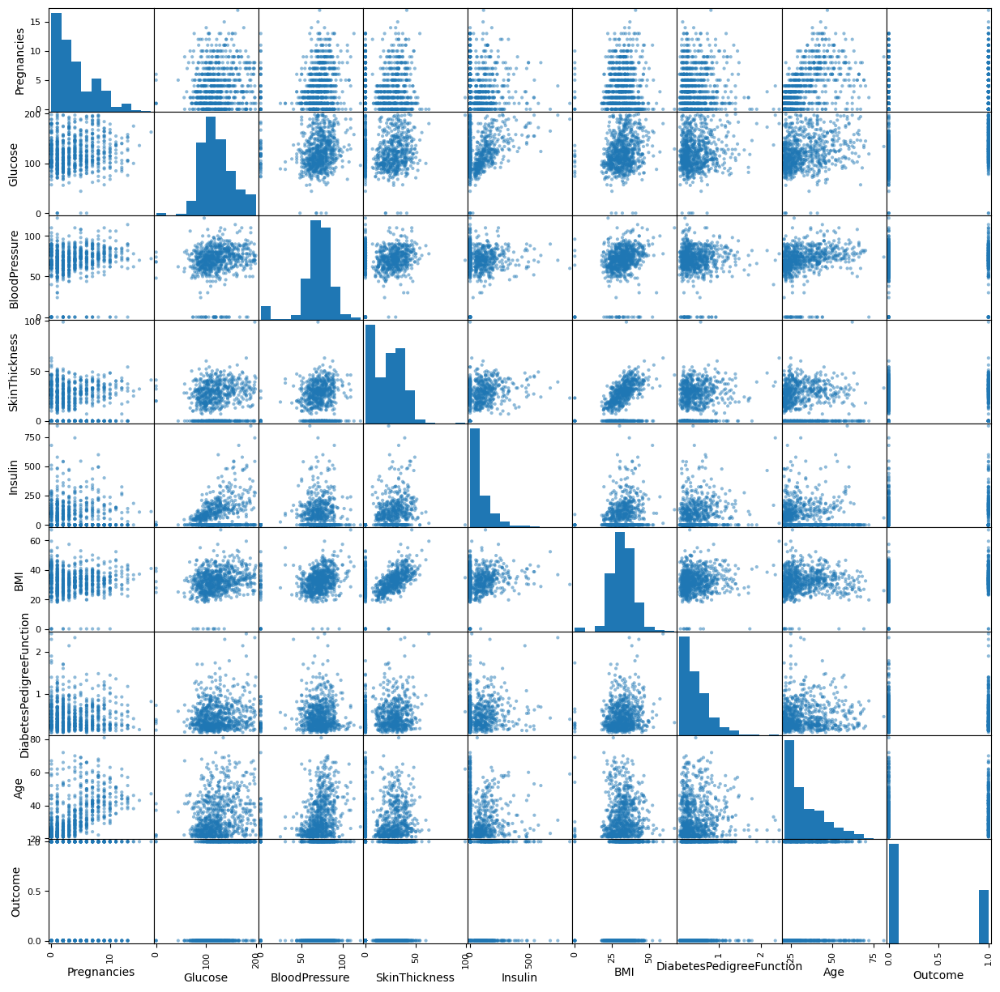

In [10]:
plot =scatter_matrix(df,figsize=(15, 15))

It was observed that no missing values or negative values exist on the dataset. However, due to zero values in some of the parameters, a few values can be considered as NaN values classified as Zero, for example in Skin Thickness (that represents the triceps skin fold thickness) and Glucose.

**Understanding/studing the 0 values observed on the plots**

- Pregnancies

In [11]:
print("Pregnancies Values:",sorted(df.Pregnancies.unique()))

Pregnancies Values: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17]


- Glucose 

In [12]:
print("Glucose Values:",sorted(df.Glucose.unique()))

Glucose Values: [0, 44, 56, 57, 61, 62, 65, 67, 68, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 186, 187, 188, 189, 190, 191, 193, 194, 195, 196, 197, 198, 199]


In [13]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['Glucose']==0]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


- Blood Presure

In [14]:
print("Blood Presure Values:",sorted(df.BloodPressure.unique()))

Blood Presure Values: [0, 24, 30, 38, 40, 44, 46, 48, 50, 52, 54, 55, 56, 58, 60, 61, 62, 64, 65, 66, 68, 70, 72, 74, 75, 76, 78, 80, 82, 84, 85, 86, 88, 90, 92, 94, 95, 96, 98, 100, 102, 104, 106, 108, 110, 114, 122]


In [15]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['BloodPressure']==0].head(15)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
7,10,115,0,0,0,35.3,0.134,29,0
15,7,100,0,0,0,30.0,0.484,32,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
78,0,131,0,0,0,43.2,0.270,26,1
81,2,74,0,0,0,0.0,0.102,22,0
172,2,87,0,23,0,28.9,0.773,25,0
193,11,135,0,0,0,52.3,0.578,40,1
222,7,119,0,0,0,25.2,0.209,37,0
261,3,141,0,0,0,30.0,0.761,27,1


- Skin Thickness

In [16]:
print("Skin Thickness Values in mm:",sorted(df.SkinThickness.unique()))

Skin Thickness Values in mm: [0, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 56, 60, 63, 99]


In [17]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['SkinThickness']==0].head(15)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
9,8,125,96,0,0,0.0,0.232,54,1
10,4,110,92,0,0,37.6,0.191,30,0
11,10,168,74,0,0,38.0,0.537,34,1
12,10,139,80,0,0,27.1,1.441,57,0
15,7,100,0,0,0,30.0,0.484,32,1
17,7,107,74,0,0,29.6,0.254,31,1
21,8,99,84,0,0,35.4,0.388,50,0


- Insulin

In [18]:
print("Insulin Values:",sorted(df.Insulin.unique()))

Insulin Values: [0, 14, 15, 16, 18, 22, 23, 25, 29, 32, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 99, 100, 105, 106, 108, 110, 112, 114, 115, 116, 119, 120, 122, 125, 126, 127, 128, 129, 130, 132, 135, 140, 142, 144, 145, 146, 148, 150, 152, 155, 156, 158, 159, 160, 165, 166, 167, 168, 170, 171, 175, 176, 178, 180, 182, 183, 184, 185, 188, 190, 191, 192, 193, 194, 196, 200, 204, 205, 207, 210, 215, 220, 225, 228, 230, 231, 235, 237, 240, 245, 249, 250, 255, 258, 265, 270, 271, 272, 274, 275, 277, 278, 280, 284, 285, 291, 293, 300, 304, 310, 318, 321, 325, 326, 328, 330, 335, 342, 360, 370, 375, 387, 392, 402, 415, 440, 465, 474, 478, 480, 485, 495, 510, 540, 543, 545, 579, 600, 680, 744, 846]


In [19]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['Insulin']==0].head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
9,8,125,96,0,0,0.0,0.232,54,1
10,4,110,92,0,0,37.6,0.191,30,0
11,10,168,74,0,0,38.0,0.537,34,1
12,10,139,80,0,0,27.1,1.441,57,0
15,7,100,0,0,0,30.0,0.484,32,1


- BMI

In [20]:
print("BMI Values:",sorted(df.BMI.unique()))

BMI Values: [0.0, 18.2, 18.4, 19.1, 19.3, 19.4, 19.5, 19.6, 19.9, 20.0, 20.1, 20.4, 20.8, 21.0, 21.1, 21.2, 21.7, 21.8, 21.9, 22.1, 22.2, 22.3, 22.4, 22.5, 22.6, 22.7, 22.9, 23.0, 23.1, 23.2, 23.3, 23.4, 23.5, 23.6, 23.7, 23.8, 23.9, 24.0, 24.1, 24.2, 24.3, 24.4, 24.5, 24.6, 24.7, 24.8, 24.9, 25.0, 25.1, 25.2, 25.3, 25.4, 25.5, 25.6, 25.8, 25.9, 26.0, 26.1, 26.2, 26.3, 26.4, 26.5, 26.6, 26.7, 26.8, 26.9, 27.0, 27.1, 27.2, 27.3, 27.4, 27.5, 27.6, 27.7, 27.8, 27.9, 28.0, 28.1, 28.2, 28.3, 28.4, 28.5, 28.6, 28.7, 28.8, 28.9, 29.0, 29.2, 29.3, 29.5, 29.6, 29.7, 29.8, 29.9, 30.0, 30.1, 30.2, 30.3, 30.4, 30.5, 30.7, 30.8, 30.9, 31.0, 31.1, 31.2, 31.3, 31.6, 31.9, 32.0, 32.1, 32.2, 32.3, 32.4, 32.5, 32.6, 32.7, 32.8, 32.9, 33.1, 33.2, 33.3, 33.5, 33.6, 33.7, 33.8, 33.9, 34.0, 34.1, 34.2, 34.3, 34.4, 34.5, 34.6, 34.7, 34.8, 34.9, 35.0, 35.1, 35.2, 35.3, 35.4, 35.5, 35.6, 35.7, 35.8, 35.9, 36.0, 36.1, 36.2, 36.3, 36.4, 36.5, 36.6, 36.7, 36.8, 36.9, 37.0, 37.1, 37.2, 37.3, 37.4, 37.5, 37.6, 37.7

In [21]:
cols = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome']
df[cols][df['BMI']==0].head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9,8,125,96,0,0,0.0,0.232,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
81,2,74,0,0,0,0.0,0.102,22,0
145,0,102,75,23,0,0.0,0.572,21,0
371,0,118,64,23,89,0.0,1.731,21,0
426,0,94,0,0,0,0.0,0.256,25,0
494,3,80,0,0,0,0.0,0.174,22,0
522,6,114,0,0,0,0.0,0.189,26,0
684,5,136,82,0,0,0.0,0.640,69,0


- Diabetes Pedigree

In [22]:
print("Diabetes Pedigree Function Values :",sorted(df.DiabetesPedigreeFunction.unique()))

Diabetes Pedigree Function Values : [0.078, 0.084, 0.085, 0.088, 0.089, 0.092, 0.096, 0.1, 0.101, 0.102, 0.107, 0.108, 0.115, 0.118, 0.121, 0.122, 0.123, 0.126, 0.127, 0.128, 0.129, 0.13, 0.133, 0.134, 0.135, 0.136, 0.137, 0.138, 0.14, 0.141, 0.142, 0.143, 0.144, 0.145, 0.147, 0.148, 0.149, 0.15, 0.151, 0.153, 0.154, 0.155, 0.156, 0.157, 0.158, 0.159, 0.16, 0.161, 0.162, 0.163, 0.164, 0.165, 0.166, 0.167, 0.17, 0.171, 0.173, 0.174, 0.175, 0.176, 0.177, 0.178, 0.179, 0.18, 0.181, 0.182, 0.183, 0.186, 0.187, 0.188, 0.189, 0.19, 0.191, 0.192, 0.194, 0.196, 0.197, 0.198, 0.199, 0.2, 0.201, 0.203, 0.204, 0.205, 0.206, 0.207, 0.209, 0.21, 0.212, 0.215, 0.217, 0.218, 0.219, 0.22, 0.221, 0.222, 0.223, 0.225, 0.226, 0.227, 0.229, 0.23, 0.231, 0.232, 0.233, 0.234, 0.235, 0.236, 0.237, 0.238, 0.239, 0.24, 0.241, 0.243, 0.244, 0.245, 0.246, 0.247, 0.248, 0.249, 0.251, 0.252, 0.253, 0.254, 0.255, 0.256, 0.257, 0.258, 0.259, 0.26, 0.261, 0.262, 0.263, 0.264, 0.265, 0.267, 0.268, 0.269, 0.27, 0.271, 

- Age

In [23]:
print("Age Values :",sorted(df.Age.unique()))

Age Values : [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 81]


### Statistics of the Dataset

In [24]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


### Correlation

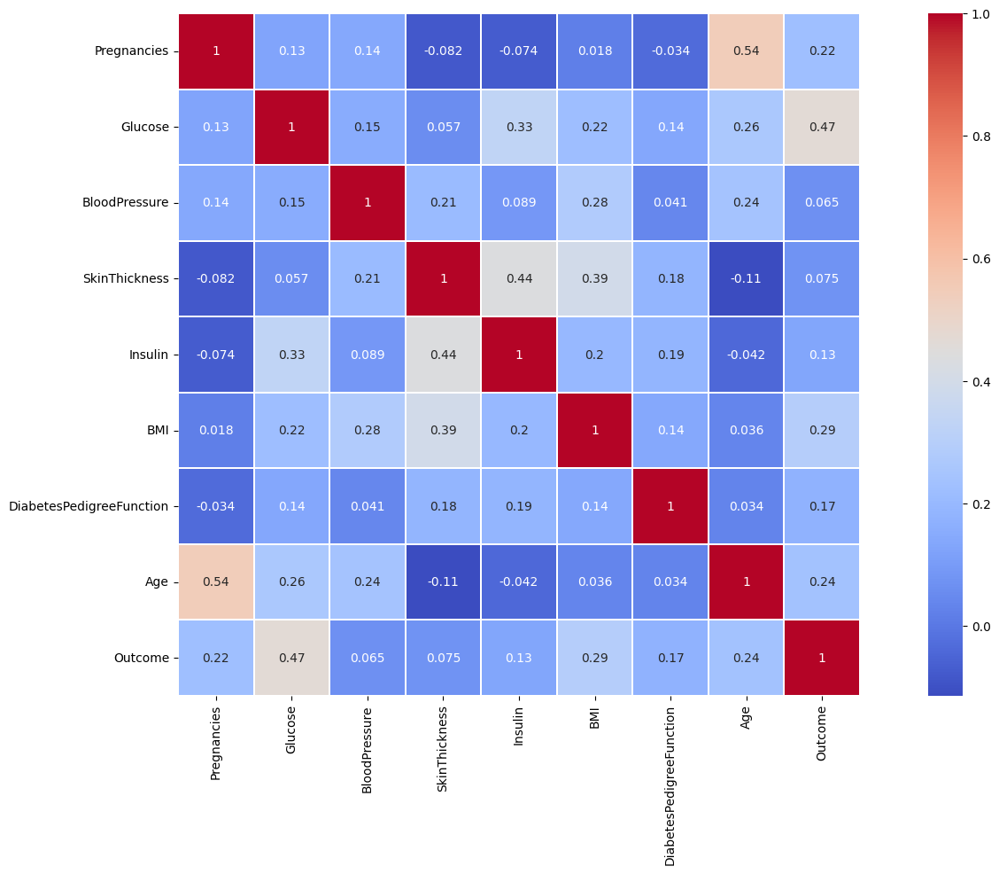

In [25]:
plt.subplots(figsize=(20, 10))
sns.heatmap(df.corr(),  square=True,  annot=True,linewidths=0.1, cmap="coolwarm")
plt.show()

### Outliers
To detect Outliers in the dataset, Z-Score test will be used, to check if the present values are more than 3 standard deviations from the mean.

In [26]:
def Zscore_outlier(df):
    out = []
    m = np.mean(df)
    sd = np.std(df)
    for i in df: 
        z = (i-m)/sd
        if np.abs(z) > 3: 
            out.append(i)
    print(f"Outliers:",out)
    out = []

def Winsorization_outliers(df):
    out = []
    q1 = np.percentile(df , 1)
    q3 = np.percentile(df , 99)
    for i in df:
        if i > q3 or i < q1:
            out.append(i)
    print(f"Outliers:",out)
    #Remove the value if its an outlier
    df = df[~df.isin(out)]
    return df
    out = []

In [27]:
for i in df.columns:
    print(f'From the Column: {i}')
    Zscore_outlier(df[i])

From the Column: Pregnancies
Outliers: [15, 17, 14, 14]
From the Column: Glucose
Outliers: [0, 0, 0, 0, 0]
From the Column: BloodPressure
Outliers: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
From the Column: SkinThickness
Outliers: [99]
From the Column: Insulin
Outliers: [543, 846, 495, 485, 495, 478, 744, 680, 545, 465, 579, 474, 480, 600, 440, 540, 480, 510]
From the Column: BMI
Outliers: [0.0, 0.0, 0.0, 0.0, 0.0, 67.1, 0.0, 0.0, 59.4, 0.0, 0.0, 57.3, 0.0, 0.0]
From the Column: DiabetesPedigreeFunction
Outliers: [2.288, 1.893, 1.781, 2.329, 1.476, 2.137, 1.731, 1.6, 2.42, 1.699, 1.698]
From the Column: Age
Outliers: [69, 72, 81, 70, 69]
From the Column: Outcome
Outliers: []


In [28]:
for i in df.columns:
    print(f'From the Column: {i}')
    Winsorization_outliers(df[i])
    #df_outliers = Winsorization_outliers(df[i])
    #df = df.append(df_outliers)

From the Column: Pregnancies
Outliers: [15, 17, 14, 14]
From the Column: Glucose
Outliers: [197, 44, 0, 0, 197, 0, 0, 197, 0, 198, 197, 199, 56]
From the Column: BloodPressure
Outliers: [110, 108, 122, 110, 108, 110, 114]
From the Column: SkinThickness
Outliers: [60, 54, 56, 54, 52, 63, 52, 99]
From the Column: Insulin
Outliers: [543, 846, 744, 680, 545, 579, 600, 540]
From the Column: BMI
Outliers: [53.2, 55.0, 67.1, 52.3, 52.3, 52.9, 59.4, 57.3]
From the Column: DiabetesPedigreeFunction
Outliers: [2.288, 1.893, 1.781, 0.088, 0.085, 0.084, 2.329, 0.089, 0.092, 0.078, 2.137, 1.731, 2.42, 0.085, 1.699, 0.088]
From the Column: Age
Outliers: [69, 72, 81, 70, 68, 69]
From the Column: Outcome
Outliers: []


The dataset was tested for outliers, with Z-Score and Winsorization, both pointed out some values that requeried some attetion as they are potencial outliers.
However, even that they are considered outliers, after further research, it was conclueded that in rare or extreme medical cases this values could be achived.<br>
This conclusion is supported by the following source: Diabetes - Diagnosis and treatment - Mayo Clinic. (2022, October 25). https://www.mayoclinic.org/diseases-conditions/diabetes/diagnosis-treatment/drc-20371451

### Data Vizualization before treatment (Pre Processing)

#### Univariate Analysis

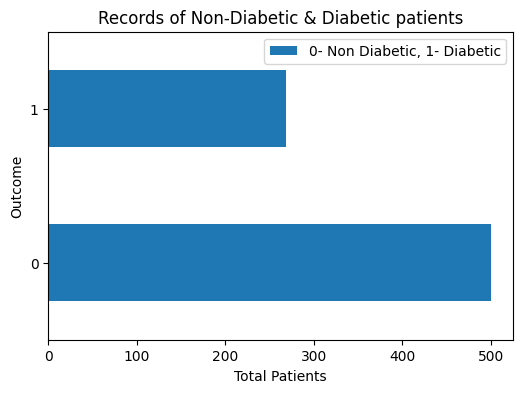

In [29]:
df['Outcome'].value_counts().plot(kind='barh',  label='0- Non Diabetic, 1- Diabetic', figsize=(6,4)) #color='blue',
plt.ylabel('Outcome')
plt.xlabel('Total Patients')
plt.title('Records of Non-Diabetic & Diabetic patients')
plt.legend()


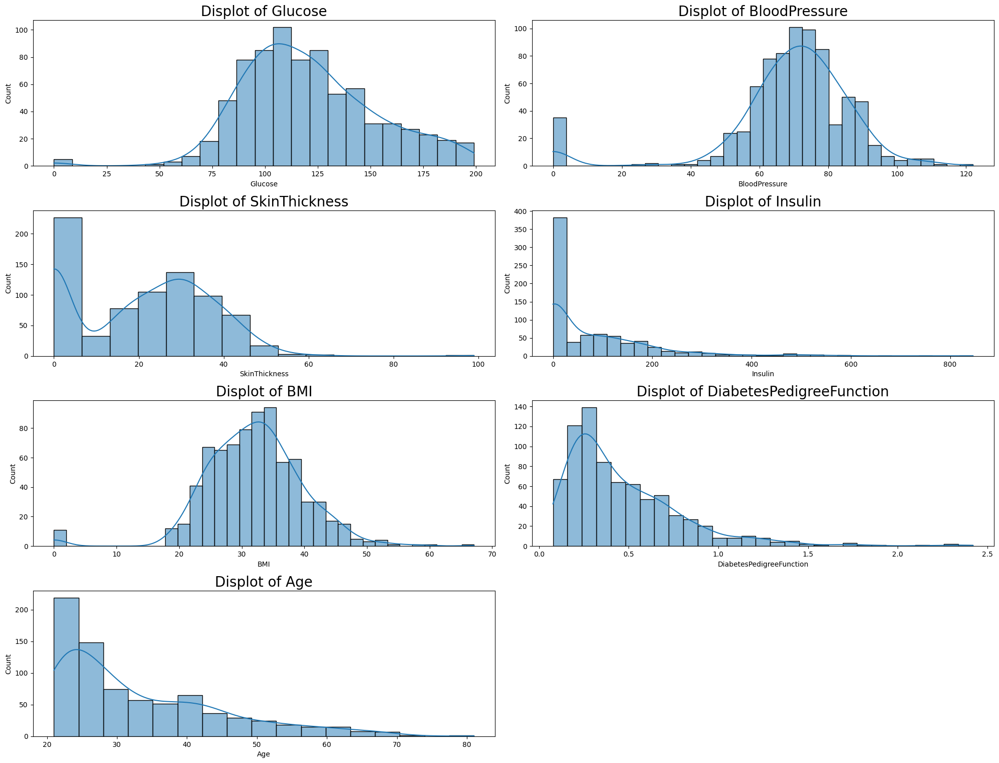

In [30]:
dis_cols = ['Glucose',"BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"]
plt.figure(figsize = (20,30))

for i in range(len(dis_cols)):
    plt.subplot(8, 2, i + 1)  # 4 Rows , 2 cols 
    sns.histplot(x = df[dis_cols[i]],kde=True)
    plt.title('Displot of {}'.format(dis_cols[i]), size = 20)
    plt.tight_layout()

**Histograms Interpretation:**<br>
<br>
Some columns are normally distrubted and some columns are right skewed:<br>
- Column distributions that are normally or roughly normally distributed are glucose, blood pressure, skin thickness and bmi.
- Column distributions that are rightly skewed are Insulin, diabetesPredigreFunction and Age.

To make all the variables normal, a normalization technique can be applied.

#### Bivariate Analysis related to target column

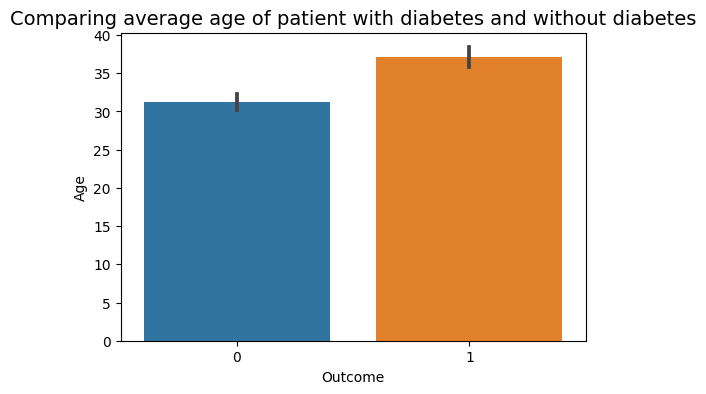

In [31]:
plt.figure(figsize=(6,4))
sns.barplot(x="Outcome",y="Age",data=df)
plt.title("Comparing average age of patient with diabetes and without diabetes", size=14)
plt.show()

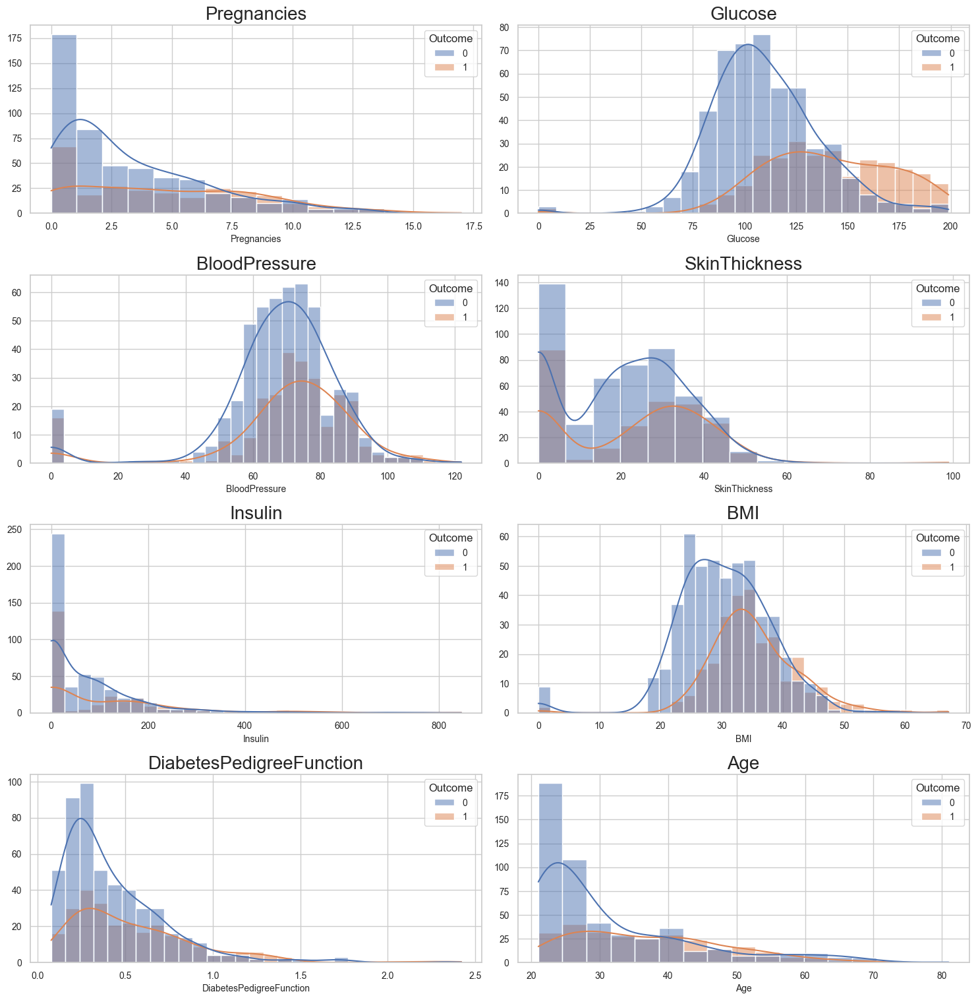

In [32]:
plt.figure(figsize=(15, 30))
sns.set(style='whitegrid')
sns.diverging_palette(250, 30, l=65, center="dark", as_cmap=True)
plotnumber = 1
 
for feature in df.columns[:8]:
    ax = plt.subplot(8, 2, plotnumber)
    ax = sns.histplot(x = feature, hue = 'Outcome', data = df, kde=True)
    plt.setp(ax.get_legend().get_texts(), fontsize='10') 
    plt.xlabel(feature, size = 10)
    plt.title(feature, size = 20)
    plt.xticks(size = 10)
    ax.set_ylabel('')
    plt.yticks(size = 10)
    plotnumber += 1
    plt.tight_layout()

**Histograms Interpretation:**<br>
<br>
When observing the above graphics, it seems that there is a diference: <br>
- in the age of the patiente with and without diabetes;<br>
- in the diabetes pedigree funtion of patientes with and without diabetes; <br>
- in the BMI of patient with diabetes and withut diabetes; <br>
- in the average insulin level of patient with diabetes and withut diabetes; <br>
- in the average skin thickness of patient with diabetes and withut diabetes; <br>
- blood pressure of patient with diabetes and withut diabetes<br>
- glucose level of patient with diabetes and withut diabetes <br>
    
To confirm if the difference is significant or not and can have impact further in the study a statistical test will be done to acess further.

##### T-Test

Applying student's t-test to determine if there is significant difference in the average age of people with diabetes and without diabetes.<br>
- H0 : There is no difference in the average age of patients with diabetes and without diabetes<br>
- H1: There is difference in the average age of patients with diabetes and without diabetes

In [33]:
# applying t-test to determine is their significant difference in age distribution of diabetic and non diabetic patients
age_with_diabetes = df[df["Outcome"] == 1]["Age"]
age_without_diabetes = df[df["Outcome"] == 0]["Age"]

# applying t-test
stat,p = ttest_ind(age_with_diabetes,age_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average age of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average age of patients with diabetes and without diabetes ")

P-value 2.2099754606654358e-11
We can reject the null hypothesis.There is  difference in the average age of patients with diabetes and without diabetes 


In [34]:
ped_func_with_diabetes = df[df["Outcome"] == 1]["DiabetesPedigreeFunction"]
ped_func_without_diabetes = df[df["Outcome"] == 0]["DiabetesPedigreeFunction"]


stat,p = ttest_ind(ped_func_with_diabetes,ped_func_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average diabetes pedigree function of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average diabetes pedigree function of patients with diabetes and without diabetes ")

P-value 1.254607010148809e-06
We can reject the null hypothesis.There is  difference in the average diabetes pedigree function of patients with diabetes and without diabetes 


In [35]:
bmi_with_diabetes = df[df["Outcome"] == 1]["BMI"]
bmi_without_diabetes = df[df["Outcome"] == 0]["BMI"]


stat,p = ttest_ind(ped_func_with_diabetes,ped_func_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average BMI of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average BMI of patients with diabetes and without diabetes ")

P-value 1.254607010148809e-06
We can reject the null hypothesis.There is  difference in the average BMI of patients with diabetes and without diabetes 


In [36]:
insulin_with_diabetes = df[df["Outcome"] == 1]["Insulin"]
insulin_without_diabetes = df[df["Outcome"] == 0]["Insulin"]


stat,p = ttest_ind(insulin_with_diabetes,insulin_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average insulin level of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average insulin level of patients with diabetes and without diabetes ")

P-value 0.00028618646036031987
We can reject the null hypothesis.There is  difference in the average insulin level of patients with diabetes and without diabetes 


In [37]:
skin_thick_with_diabetes = df[df["Outcome"] == 1]["SkinThickness"]
skin_thick_without_diabetes = df[df["Outcome"] == 0]["SkinThickness"]


stat,p = ttest_ind(skin_thick_with_diabetes,skin_thick_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average Skin Thickness of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average Skin Thickness of patients with diabetes and without diabetes ")

P-value 0.03834770482049123
We can reject the null hypothesis.There is  difference in the average Skin Thickness of patients with diabetes and without diabetes 


In [38]:
blood_pressure_with_diabetes = df[df["Outcome"] == 1]["BloodPressure"]
blood_pressure_without_diabetes = df[df["Outcome"] == 0]["BloodPressure"]


stat,p = ttest_ind(blood_pressure_with_diabetes,blood_pressure_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average Blood Pressure of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average Blood Pressure of patients with diabetes and without diabetes ")

P-value 0.0715139000977608
We cannot reject the null hypothesis.There is no difference in the average Blood Pressure of patients with diabetes and without diabetes 


In [39]:
glucose_with_diabetes = df[df["Outcome"] == 1]["Glucose"]
glucose_without_diabetes = df[df["Outcome"] == 0]["Glucose"]


stat,p = ttest_ind(glucose_with_diabetes,glucose_without_diabetes)
if p > 0.05:
    print("P-value {}".format(p))
    print("We cannot reject the null hypothesis.There is no difference in the average glucose of patients with diabetes and without diabetes ")
else:
    print("P-value {}".format(p))
    print("We can reject the null hypothesis.There is  difference in the average glucose of patients with diabetes and without diabetes ")

P-value 8.935431645289913e-43
We can reject the null hypothesis.There is  difference in the average glucose of patients with diabetes and without diabetes 


#### Multivariante Graphs

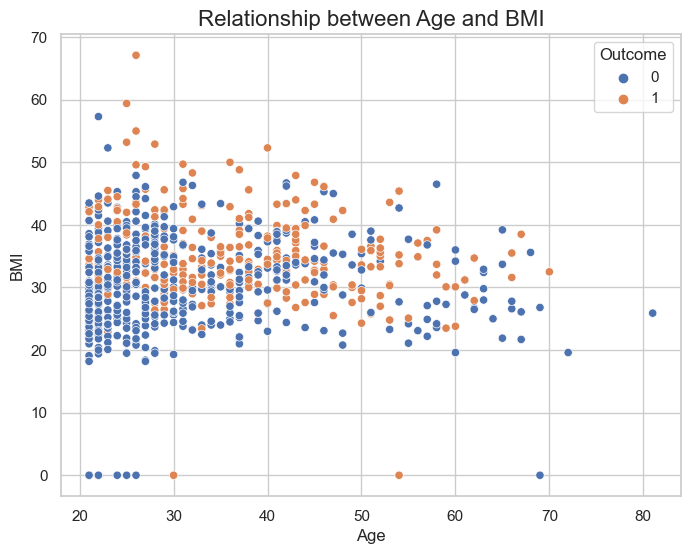

In [40]:
#scatterplot of age vs bmi to detect if a relationship exist
plt.figure(figsize=(8,6))
sns.scatterplot(x="Age",y="BMI",data=df,hue="Outcome")
plt.title('Relationship between Age and BMI', size = 16)
plt.show()

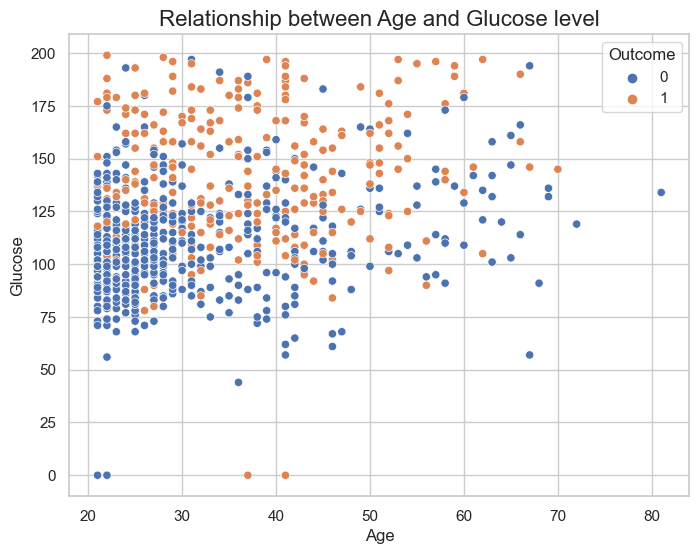

In [41]:
#scatterplot of Age vs Glucose level to detect if a relationship exist
plt.figure(figsize=(8,6))
sns.scatterplot(x="Age",y="Glucose",data=df,hue="Outcome")
plt.title('Relationship between Age and Glucose level', size = 16)
plt.show()

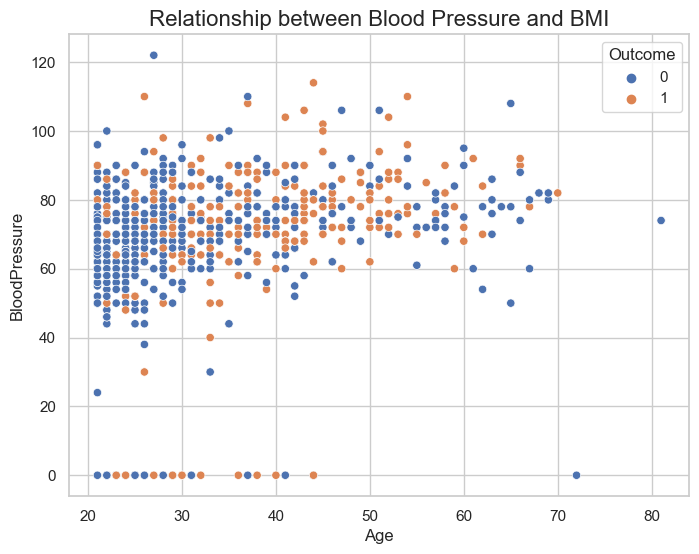

In [42]:
#scatterplot of age vs blood pressure to detect if a relationship exist
plt.figure(figsize=(8,6))
sns.scatterplot(x="Age",y="BloodPressure",data=df,hue="Outcome")
plt.title('Relationship between Blood Pressure and BMI', size = 16)
plt.show()

**Main Conclusions:** <br>
In the grafics for each variable it's possible to observe that there is a difference in the mean of a variable for a diabetic and a non-diabetic patient. <br>
By appling the T-Test to determine if the difference suggested by the graph is real or not, it possible to conclude/observe that there is a tendency for a patient that suffers from diabetes to have the following carharacteristics:<br>
    - are older<br>
    - have high glucose levels<br>
    - have high blood pressure<br>
    - have high bmi<br>
    - have high diabetes pedrigree function<br>


## **Pre processing**
- Standard Scaler
- PCA
- Hiperparams Fine Tunning
- Drop Outliers
- Min-Max Scaler



1 - Retirar os nulos
2 - Retirar os outliers


1 . Removing Null Values

In [43]:
df_copy = df.copy(deep = True)
df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)

## showing the count of Nans
print(df_copy.isnull().sum())

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64


In [44]:
# Inputing the missing values with their most useful parameters: mean or median.
df_copy['Glucose'].fillna(df_copy['Glucose'].mean(), inplace = True)
df_copy['BloodPressure'].fillna(df_copy['BloodPressure'].mean(), inplace = True)
df_copy['SkinThickness'].fillna(df_copy['SkinThickness'].median(), inplace = True)
df_copy['Insulin'].fillna(df_copy['Insulin'].median(), inplace = True)
df_copy['BMI'].fillna(df_copy['BMI'].median(), inplace = True)

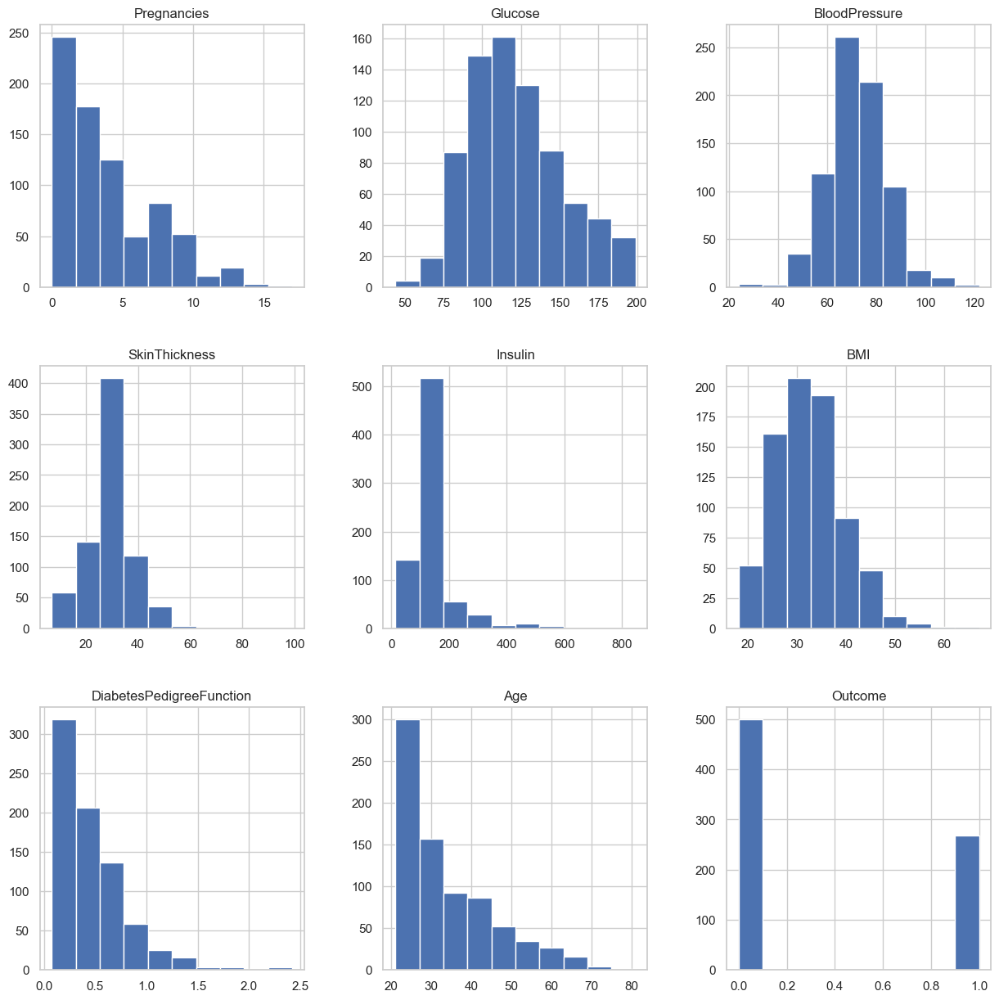

In [45]:
p = df_copy.hist(figsize = (15,15))

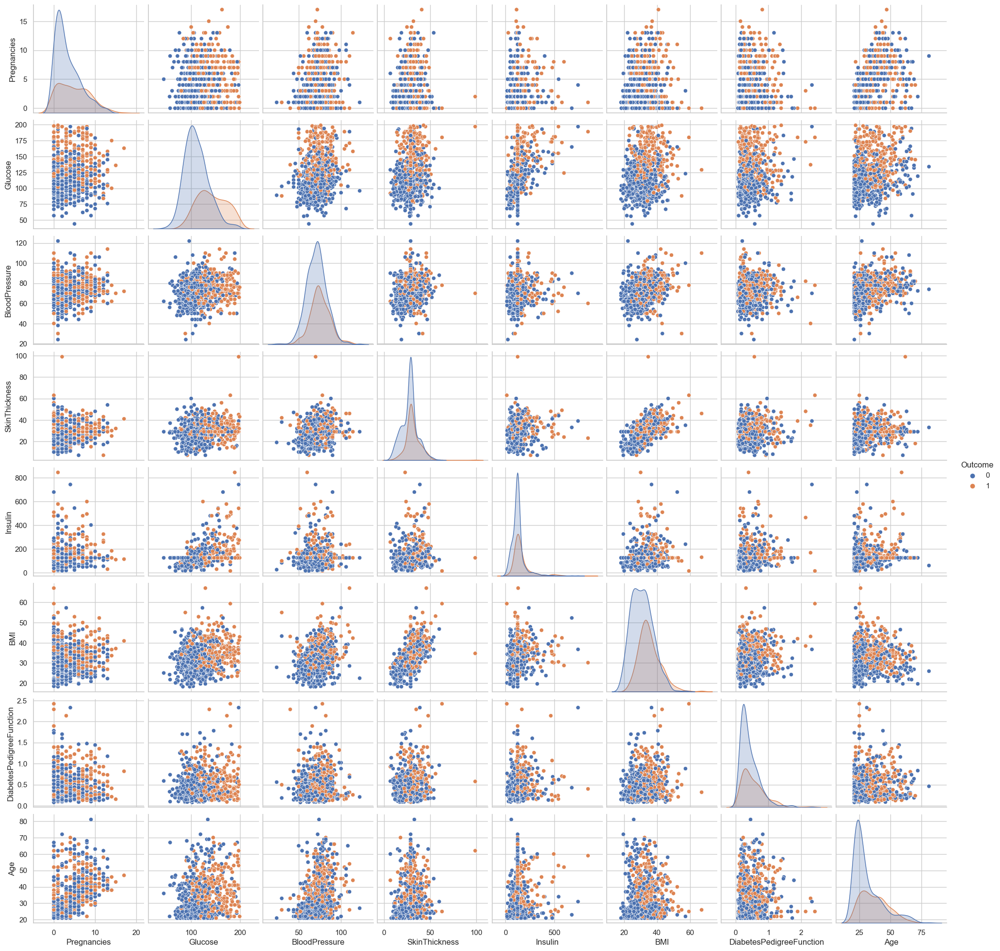

In [46]:
p=sns.pairplot(df_copy, hue = 'Outcome')

2. Removing Outliers <br>
The outliers will be treated/removed, based on the results of EDA step, where Z-Score and Winsorization test were used to acess the outliers in the dataset.

In [47]:
for i in df.columns:
    df_outliers = Winsorization_outliers(df[i])
    #df_outliers = df_outliers.append(df_outliers)

Outliers: [15, 17, 14, 14]
Outliers: [197, 44, 0, 0, 197, 0, 0, 197, 0, 198, 197, 199, 56]
Outliers: [110, 108, 122, 110, 108, 110, 114]
Outliers: [60, 54, 56, 54, 52, 63, 52, 99]
Outliers: [543, 846, 744, 680, 545, 579, 600, 540]
Outliers: [53.2, 55.0, 67.1, 52.3, 52.3, 52.9, 59.4, 57.3]
Outliers: [2.288, 1.893, 1.781, 0.088, 0.085, 0.084, 2.329, 0.089, 0.092, 0.078, 2.137, 1.731, 2.42, 0.085, 1.699, 0.088]
Outliers: [69, 72, 81, 70, 68, 69]
Outliers: []


In [48]:
df_outliers.head()

0    1
1    0
2    1
3    0
4    1
Name: Outcome, dtype: int64

In [49]:
df_outliers = pd.DataFrame()
for i in df_copy.columns:
    print(f'From the Column: {i}')
    column_outliers = Winsorization_outliers(df_copy[i])
    df_outliers = df_outliers.append(column_outliers)

From the Column: Pregnancies
Outliers: [15, 17, 14, 14]
From the Column: Glucose
Outliers: [197.0, 44.0, 62.0, 57.0, 197.0, 61.0, 197.0, 57.0, 198.0, 197.0, 67.0, 199.0, 56.0, 65.0]
From the Column: BloodPressure
Outliers: [40.0, 30.0, 110.0, 108.0, 122.0, 30.0, 110.0, 108.0, 110.0, 24.0, 38.0, 114.0]
From the Column: SkinThickness
Outliers: [60.0, 54.0, 56.0, 54.0, 7.0, 52.0, 8.0, 8.0, 63.0, 7.0, 52.0, 99.0]
From the Column: Insulin
Outliers: [543.0, 846.0, 23.0, 18.0, 23.0, 744.0, 680.0, 545.0, 579.0, 14.0, 18.0, 600.0, 15.0, 540.0, 22.0, 16.0]
From the Column: BMI
Outliers: [19.4, 19.1, 53.2, 55.0, 67.1, 52.3, 18.4, 52.3, 52.9, 19.3, 18.2, 18.2, 59.4, 18.2, 57.3]
From the Column: DiabetesPedigreeFunction
Outliers: [2.288, 1.893, 1.781, 0.088, 0.085, 0.084, 2.329, 0.089, 0.092, 0.078, 2.137, 1.731, 2.42, 0.085, 1.699, 0.088]
From the Column: Age
Outliers: [69, 72, 81, 70, 68, 69]
From the Column: Outcome
Outliers: []


In [50]:
df_outliers = df_outliers.transpose()
df_outliers.sort_index(inplace=True)

In [51]:
df_outliers.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,125.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,125.0,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,29.0,125.0,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,0.0,137.0,NaN,35.0,168.0,43.1,NaN,33.0,1.0


Filling up the gaps that appear from the Outliers with mean and median values

In [52]:
df_outliers['Glucose'].fillna(df_outliers['Glucose'].mean(), inplace = True)
df_outliers['BloodPressure'].fillna(df_outliers['BloodPressure'].mean(), inplace = True)
df_outliers['SkinThickness'].fillna(df_outliers['SkinThickness'].median(), inplace = True)
df_outliers['Insulin'].fillna(df_outliers['Insulin'].median(), inplace = True)
df_outliers['BMI'].fillna(df_outliers['BMI'].median(), inplace = True)
df_outliers['DiabetesPedigreeFunction'].fillna(df_outliers['DiabetesPedigreeFunction'].median(), inplace = True)
df_outliers['Age'].fillna(df_outliers['Age'].median(), inplace = True)
df_outliers['Pregnancies'].fillna(df_outliers['Pregnancies'].mean(), inplace = True)

In [53]:
df_outliers.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

## **Feature engineering**
3 - MinMaxScaler

MinMaxScaler to Enhance the Dataset Classification Power

In [54]:
try:
    MinMaxScaler = MinMaxScaler()
except:
    None
df_minmax = MinMaxScaler.fit_transform(df_outliers)

In [55]:
df_minmax = pd.DataFrame(df_minmax, columns = df_outliers.columns)
df_minmax.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.461538,0.625000,0.451613,0.609756,0.206186,0.462295,0.331461,0.630435,1.0
1,0.076923,0.132812,0.354839,0.463415,0.206186,0.232787,0.159176,0.217391,0.0
2,0.615385,0.898438,0.322581,0.463415,0.206186,0.124590,0.359551,0.239130,1.0
3,0.076923,0.164062,0.354839,0.317073,0.142268,0.281967,0.044320,0.000000,0.0
4,0.000000,0.539062,0.456545,0.609756,0.294845,0.773770,0.172597,0.260870,1.0


## **Feature Selection**

In [56]:
df_minmax

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.461538,0.625000,0.451613,0.609756,0.206186,0.462295,0.331461,0.630435,1.0
1,0.076923,0.132812,0.354839,0.463415,0.206186,0.232787,0.159176,0.217391,0.0
2,0.615385,0.898438,0.322581,0.463415,0.206186,0.124590,0.359551,0.239130,1.0
3,0.076923,0.164062,0.354839,0.317073,0.142268,0.281967,0.044320,0.000000,0.0
4,0.000000,0.539062,0.456545,0.609756,0.294845,0.773770,0.172597,0.260870,1.0
...,...,...,...,...,...,...,...,...,...
763,0.769231,0.257812,0.516129,0.926829,0.319588,0.439344,0.046816,0.913043,0.0
764,0.153846,0.421875,0.419355,0.414634,0.206186,0.567213,0.152310,0.130435,0.0
765,0.384615,0.414062,0.451613,0.317073,0.179381,0.219672,0.093009,0.195652,0.0
766,0.076923,0.453125,0.258065,0.463415,0.206186,0.347541,0.157928,0.565217,1.0


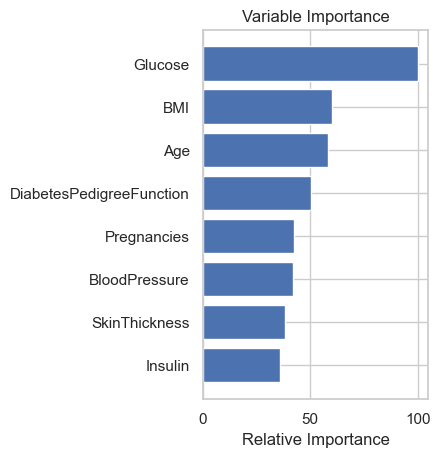

In [57]:
x = df_minmax[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']]
y = df_minmax['Outcome']

#ExtraTreesClassifier to select features based on importance of features in the dataset

clf = ExtraTreesClassifier(n_estimators=250,
                              random_state=SEED)
clf.fit(x , y)
# #############################################################################
# Plot feature importance
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, df.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

In [58]:
df_selected = df_minmax[[ 'Glucose','BMI','Age','DiabetesPedigreeFunction','Outcome']]


## **Models**

Good Resource: https://www.kaggle.com/code/pouryaayria/a-complete-ml-pipeline-tutorial-acu-86
- KNN Classifier
- Random Forest
- Decision Tree
- Adaboost
- Logistic Regression
- Gaussian NB
- ExtraTreesClassifier
- XgBoost Classifier


In [59]:
# Train Test Split of the data
from sklearn.model_selection import train_test_split
x = df_selected[['Glucose','BMI','Age','DiabetesPedigreeFunction',]]
y = df_selected['Outcome']
X_train, X_test, y_train, y_test =train_test_split(x,y,test_size=0.25,random_state=0,stratify=df_copy['Outcome'])

In [60]:
def GetBasedModel():
    basedModels = []
    basedModels.append(('LR'   , LogisticRegression(max_iter=100)))
    basedModels.append(('LDA'  , LinearDiscriminantAnalysis()))
    basedModels.append(('KNN'  , KNeighborsClassifier()))
    basedModels.append(('CART' , DecisionTreeClassifier()))
    basedModels.append(('NB'   , GaussianNB()))
    basedModels.append(('SVM'  , SVC(probability=True)))
    basedModels.append(('AB'   , AdaBoostClassifier()))
    basedModels.append(('GBM'  , GradientBoostingClassifier()))
    basedModels.append(('RF'   , RandomForestClassifier()))
    basedModels.append(('ET'   , ExtraTreesClassifier()))
    basedModels.append(('XGB'  , XGBClassifier()))

    
    return basedModels

10-Fold Cross Validation for larger test and more trustworthy result

In [61]:
def BasedLine2(X_train, y_train,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = 'accuracy'

    results = []
    names = []
    data_pred = []
    for name, model in models:
        kfold = StratifiedKFold(n_splits=num_folds,shuffle=True, random_state=SEED)
        cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
        y_pred = cross_val_predict(model, X_train, y_train, cv=kfold)
        data_pred.append(y_pred)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
        
    return names, results, data_pred

In [62]:
class PlotBoxR(object):
    
    def __Trace(self,nameOfFeature,value): 
    
        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)',
            )
        )
        return trace

    def PlotResult(self,names,results):
        
        data = []

        for i in range(len(names)):
            data.append(self.__Trace(names[i],results[i]))


        py.iplot(data)

In [63]:
models = GetBasedModel()
names,results,data_pred = BasedLine2(X_train, y_train,models)
PlotBoxR().PlotResult(names,results)

LR: 0.764035 (0.060710)
LDA: 0.764065 (0.058034)
KNN: 0.718784 (0.087651)
CART: 0.692650 (0.061552)
NB: 0.758863 (0.067307)
SVM: 0.769147 (0.072132)
AB: 0.736207 (0.063703)
GBM: 0.741319 (0.075488)
RF: 0.730853 (0.075273)
ET: 0.729310 (0.070007)
XGB: 0.723956 (0.065987)



## **Evaluation**
- Confusion Matrix
- F1 Scores (Recall + Precision)
- ROC and AUC

For the evaluation of the process, we are gonna start with a confusion matrix for each one of the Models:

In [64]:
def evaluation(names,models,X_train,y_train,X_test,y_test):
    models = GetBasedModel()
    for name, model in models:
        y_pred = model.fit(X_train, y_train).predict(X_test)
        print('')
        print(f'Model Tested: {name}')
        print('Classification Report:')
        print(classification_report(y_test, y_pred))
        #print(confusion_matrix(y_test, y_pred))
        print(f'Accurary Score: {accuracy_score(y_test, y_pred)}')
        crosstab = pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)
        print('')
        print('Confusion Matrix for the Algorithm:')
        print(crosstab)
        print('')
        print('*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*')
    #return y_pred

In [65]:
evaluation(names,models,X_train,y_train,X_test,y_test)


Model Tested: LR
Classification Report:
              precision    recall  f1-score   support

         0.0       0.79      0.89      0.84       125
         1.0       0.73      0.57      0.64        67

    accuracy                           0.78       192
   macro avg       0.76      0.73      0.74       192
weighted avg       0.77      0.78      0.77       192

Accurary Score: 0.7760416666666666

Confusion Matrix for the Algorithm:
Predicted  0.0  1.0  All
True                    
0.0        111   14  125
1.0         29   38   67
All        140   52  192

*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*

Model Tested: LDA
Classification Report:
              precision    recall  f1-score   support

         0.0       0.80      0.87      0.84       125
         1.0       0.71      0.60      0.65        67

    accuracy                           0.78       192
   macro avg       0.76      0.73      0.74       192
weighted avg       0.77      0.78      0

In [66]:
#ROC Curve
def ROC_Curve(names,models,X_train,y_train,X_test,y_test):
    models = GetBasedModel()
    for name, model in models:
        y_pred = model.fit(X_train, y_train).predict(X_test)
        fpr, tpr, thresholds = roc_curve(y_test, y_pred)
        roc_auc = auc(fpr, tpr)
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.3f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'{name} ROC Curve')
        plt.legend(loc="lower right")
        plt.show()

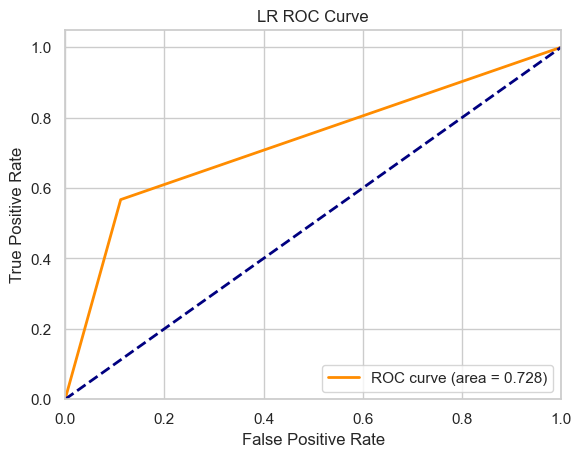

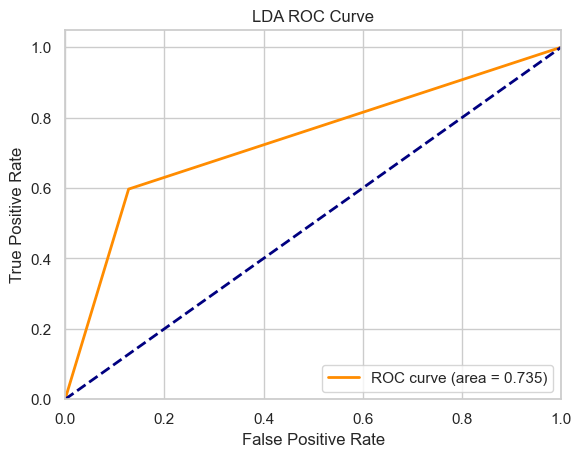

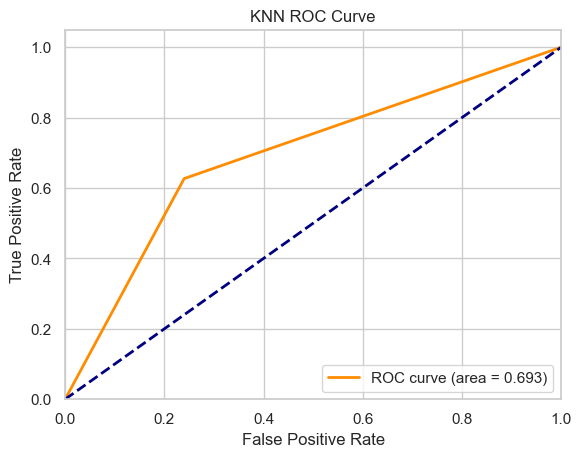

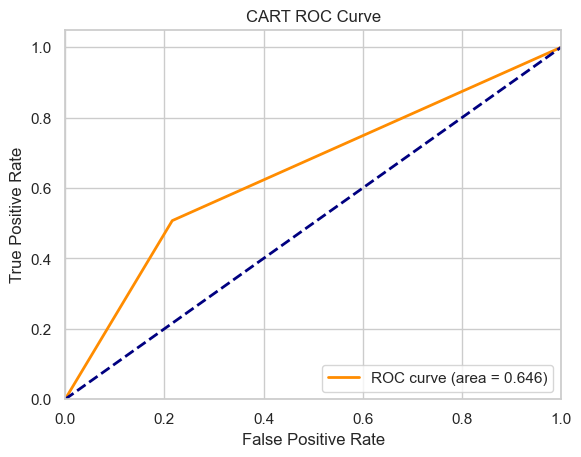

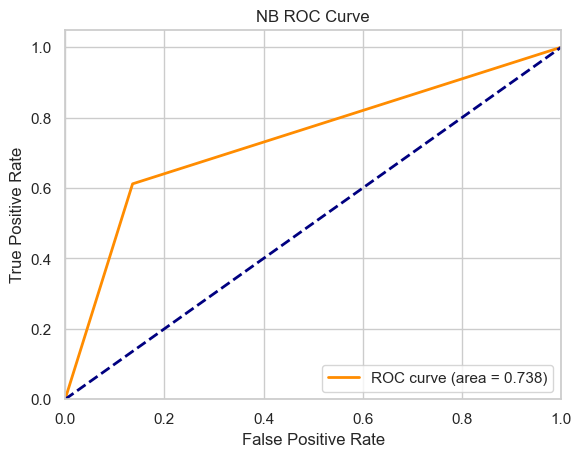

...

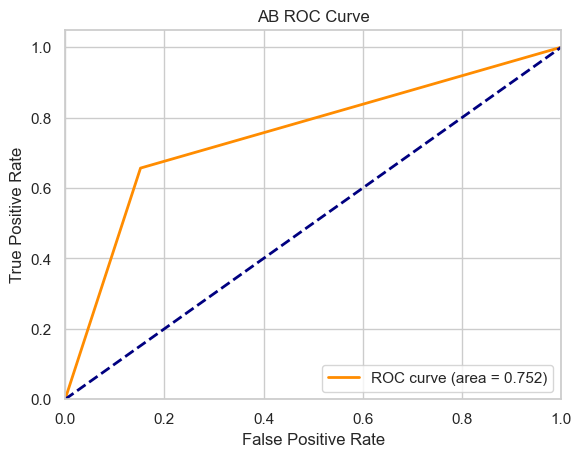

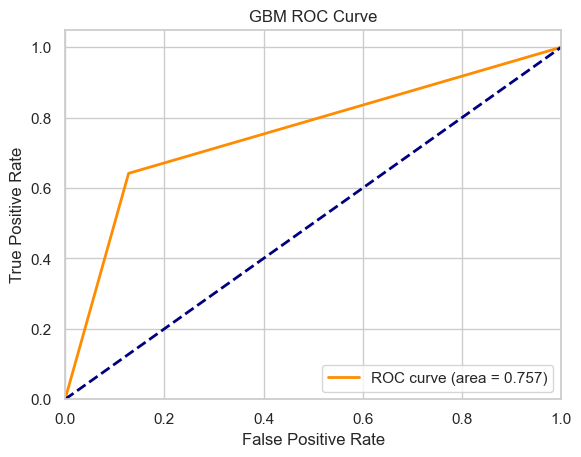

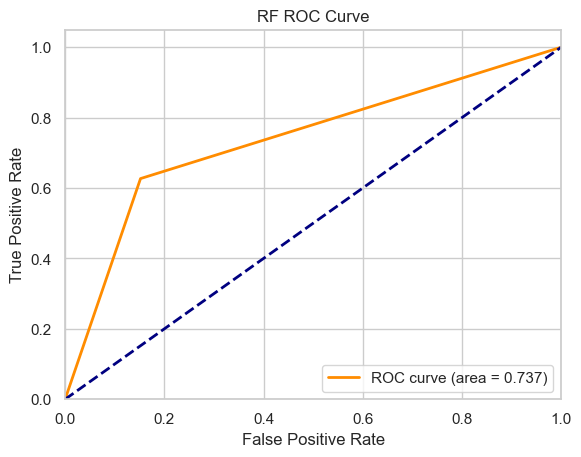

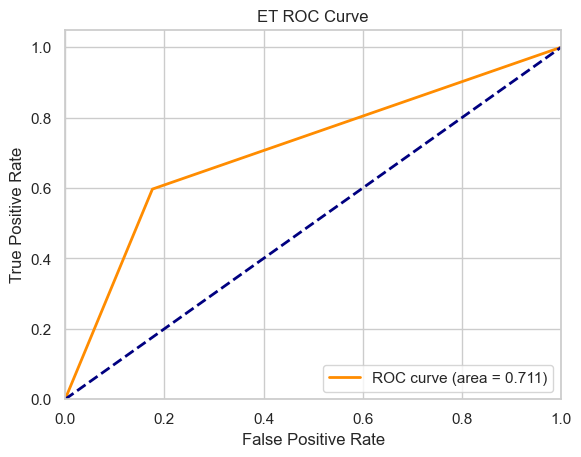

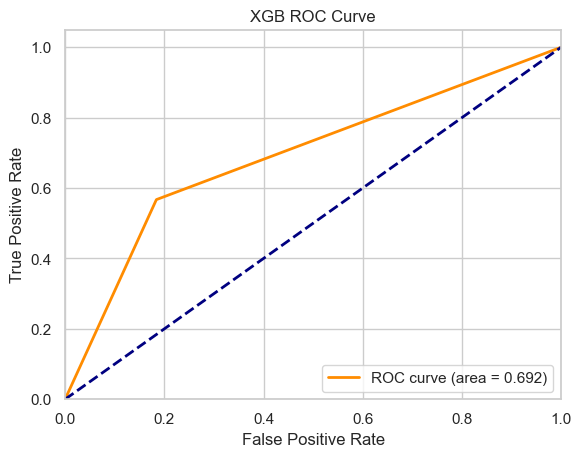

In [67]:
ROC_Curve(names,models,X_train,y_train,X_test,y_test)

### Conclusions

In classification problems, the F1-Score, ROC, and Accuracy are all metrics that can be used to evaluate the performance of a model.

The F1-Score is a measure of a model's accuracy that takes into account both the precision and the recall of the model. Precision is the proportion of correct positive predictions made by the model, while recall is the proportion of actual positive cases that the model was able to identify. The F1-Score is calculated as the harmonic mean of the precision and recall, and is a useful metric for comparing the performance of different models.

The ROC, or receiver operating characteristic, is a plot that shows the relationship between the false positive rate and the true positive rate of a classification model. The false positive rate is the proportion of negative cases that are incorrectly classified as positive, while the true positive rate is the proportion of positive cases that are correctly classified as such. The ROC curve is a useful tool for evaluating a model's performance and comparing it to other models.

Finally, the accuracy of a classification model is simply the proportion of data points that the model correctly classifies. This is a commonly used metric, but it can be misleading, especially when the data is imbalanced (i.e. when there are unequal numbers of positive and negative cases). In such cases, the F1-Score and ROC may be more informative measures of a model's performance.

In the particular case, what happen with the 10-fold cross-validation is that we had a near proximity result for most of the classifiers used on this exercise. However a few of them performed in a best manner than others.

For this some highlights for this exercise are the following ones: Linear Discriminant Analysis and Gradient Boosting Machine Classifier.
The Gradient Boost Classifier was a better classificator in a ROC metric (0.757), mostly due to it's good tolerance for inbalanced data, and it's ability to combine multiple weak classificators into a strong one, which is the case in this dataset, which the strongest one of the classifiers have a correlation with Outcome variable of 54%
The Linear Discriminant Analysis also was a Highlight due it's good accuracy and F1-Score in relation to other classifiers (0.7640 and 0.78 respectively). This slightly better accuracy has foundation in the logic behind the classifier itself. This specific classifier works with linear method of resolution where you can generate linear methods between the classes and emsemble them afterwards. The Classificator also works with a Generative model, that stacks multiple linear regressor into a classifier, different then a method like an SVC, that utilizes discriminative bounds to split the classes in the model.

Due to this aspects, in a production environment, both of these classifiers could be strong candidates for being utilized in classification of Diabetes in the field.